# Exploring H20 Explainers
## CHAPTER 09 - *Other popular XAI frameworks*

From **Applied Machine Learning Explainability Techniques** by [**Aditya Bhattacharya**](https://www.linkedin.com/in/aditya-bhattacharya-b59155b6/), published by **Packt**

### Objective

In this notebook, we will explore the application of H2o Explainers https://docs.h2o.ai/h2o/latest-stable/h2o-docs/explain.html# using an H2o AutoML model. We will use the same dataset covered for the Explainerdashboard tutorial - https://github.com/PacktPublishing/Applied-Machine-Learning-Explainability-Techniques/blob/main/Chapter09/Explainer_dashboard_example.ipynb. Only the model training and explanation part will be different, otherwise the initial part of the tutorial is almost same. Please try out the Explainerdashboard tutorial if you haven't tried it out already!

### Installing the modules

Install the following libraries in Google Colab or your local environment, if not already installed.

In [ ]:
!pip install --upgrade pandas numpy matplotlib seaborn scikit-learn h2o

### Loading the modules

In [1]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
pd.set_option('display.max_columns', None)

import numpy as np

import sklearn
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error


import matplotlib.pyplot as plt
import seaborn as sns

from IPython import display

import h2o
from h2o.automl import H2OAutoML

np.random.seed(123)

### About the data

**FIFA Club Position Prediction dataset - [FIFA Club Position Prediction dataset](https://github.com/PacktPublishing/Applied-Machine-Learning-Explainability-Techniques/tree/main/Chapter09/datasets/FIFA_Club_Position)**

In this tutorial we will use the FIFA Club Position Prediction dataset to predict the league position of the top football clubs playing in the top football leagues of the world. Please go through the data description to find out more.

### Loading the data

In [2]:
# We will read the training data
df_train = pd.read_csv('datasets/FIFA_Club_Position/fifa_league_21_train.csv')

In [3]:
df_train.head()

,short_name,overall,potential,value_eur,wage_eur,age,club_name,league_name,club_position,preferred_foot,weak_foot,skill_moves,international_reputation,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,rb,lcb,cb,rcb,gk,position
0,L. Messi,93,93,103500000.0,560000.0,33,FC Barcelona,Spain Primera Division,CAM,Left,4,4,5,85.0,92.0,91.0,95.0,38.0,65.0,85,95,70,91,88,96,93,94,91,96,91,80,91,94,95,86,68,72,69,94,44,40,93,95,75,96,32,35,24,6,11,15,14,8,NaN,92,92,92,92,93,93,93,92,93,93,93,93,90,90,90,93,69,68,68,68,69,65,65,55,55,55,22,3
1,Cristiano Ronaldo,92,92,63000000.0,220000.0,35,Juventus,Italian Serie A,LS,Right,4,5,5,89.0,93.0,81.0,89.0,35.0,77.0,84,95,90,82,86,88,81,76,77,92,87,91,87,95,71,94,95,84,78,93,63,29,95,82,84,95,28,32,24,7,11,15,14,11,NaN,92,92,92,89,91,91,91,89,91,91,91,91,84,84,84,91,68,64,64,64,68,64,64,57,57,57,23,4
2,R. Lewandowski,91,91,111000000.0,240000.0,31,FC Bayern München,German 1. Bundesliga,ST,Right,4,4,4,78.0,91.0,78.0,85.0,43.0,82.0,71,94,85,84,89,85,79,85,70,88,77,78,77,93,82,89,84,76,86,85,81,49,94,79,88,88,35,42,19,15,6,12,8,10,NaN,91,91,91,85,87,87,87,85,88,88,88,86,82,82,82,86,67,68,68,68,67,64,64,63,63,63,22,1
3,Neymar Jr,91,91,132000000.0,270000.0,28,Paris Saint-Germain,French Ligue 1,LW,Right,5,5,5,91.0,85.0,86.0,94.0,36.0,59.0,85,87,62,87,87,95,88,89,81,95,94,89,96,91,83,80,62,81,50,84,51,36,87,90,92,93,35,30,29,9,9,15,15,11,NaN,87,87,87,90,89,89,89,90,91,91,91,91,86,86,86,91,70,65,65,65,70,65,65,52,52,52,23,2
4,K. De Bruyne,91,91,129000000.0,370000.0,29,Manchester City,English Premier League,RCM,Right,5,4,4,76.0,86.0,93.0,88.0,64.0,78.0,94,82,55,94,82,88,85,83,93,92,77,76,78,91,76,91,63,89,74,91,76,66,88,94,84,91,68,65,53,15,13,5,10,13,NaN,86,86,86,88,88,88,88,88,91,91,91,91,91,91,91,91,82,83,83,83,82,78,78,72,72,72,24,1


In [4]:
# Reading the dataset description
with open('datasets/FIFA_Club_Position/data_description.txt') as f:
    contents = f.read()
    print(contents)

-------------------------------------
FIFA Club Position Prediction dataset.
--------------------------------------
The dataset is prepared from the Kaggle Fifa 22 Player dataset: https://www.kaggle.com/stefanoleone992/fifa-22-complete-player-dataset. Original dataset acknowledgement is provided to the website sofifa.com as the data is scrapped from the publicly available website.

The training data is for top 10 clubs for the 2020-21 season from English Premier League, La Liga, Serie A, Bundesliga 1, French League 1.

The test data is unlabeled and contains the player information of the same teams for 2021-2022 season.

The datasets contains the following features:

- Players available in FIFA 21, and also FIFA 22 for the selected clubs and leagues

- 80+ attributes

- The club `position` is the target variable that the model needs to predict.

- Player positions, with the role in the club

- Player attributes with statistics as Attacking, Skills, Defense, Mentality, GK Skills, etc.



In [5]:
# Check dataset dimensions
print(df_train.shape)

(1584, 82)


In [6]:
df_train.columns

Index(['short_name', 'overall', 'potential', 'value_eur', 'wage_eur', 'age',
       'club_name', 'league_name', 'club_position', 'preferred_foot',
       'weak_foot', 'skill_moves', 'international_reputation', 'pace',
       'shooting', 'passing', 'dribbling', 'defending', 'physic',
       'attacking_crossing', 'attacking_finishing',
       'attacking_heading_accuracy', 'attacking_short_passing',
       'attacking_volleys', 'skill_dribbling', 'skill_curve',
       'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control',
       'movement_acceleration', 'movement_sprint_speed', 'movement_agility',
       'movement_reactions', 'movement_balance', 'power_shot_power',
       'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots',
       'mentality_aggression', 'mentality_interceptions',
       'mentality_positioning', 'mentality_vision', 'mentality_penalties',
       'mentality_composure', 'defending_marking_awareness',
       'defending_standing_tackle', 'defending_

In [7]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1584 entries, 0 to 1583
Data columns (total 82 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   short_name                   1584 non-null   object 
 1   overall                      1584 non-null   int64  
 2   potential                    1584 non-null   int64  
 3   value_eur                    1583 non-null   float64
 4   wage_eur                     1584 non-null   float64
 5   age                          1584 non-null   int64  
 6   club_name                    1584 non-null   object 
 7   league_name                  1584 non-null   object 
 8   club_position                1584 non-null   object 
 9   preferred_foot               1584 non-null   object 
 10  weak_foot                    1584 non-null   int64  
 11  skill_moves                  1584 non-null   int64  
 12  international_reputation     1584 non-null   int64  
 13  pace              

As we can see, the dataset contains close to 81 features, out of which input values like the name of the player, name of the club, name of the league and preferred foot might not be helpful to decide the team's position in the next season. The basic intuition is that the team's position is decided by the quality of the players and strength of the players in different playing positions. So, the player's playing position can be an important feature, as it also gives some indication about the depth of the squad in terms of reserves and substitutes, which can be a deciding factor for predicting the club's position. Let's do some data preprocessing based on this intuitions.

### Data Pre-processing

In [8]:
# Drop un-necessary features
features_to_drop = ['short_name', 'club_name', 'league_name', 'preferred_foot']

In [9]:
df_train.drop(columns=features_to_drop, inplace=True)

In [10]:
print(df_train.shape)

(1584, 78)


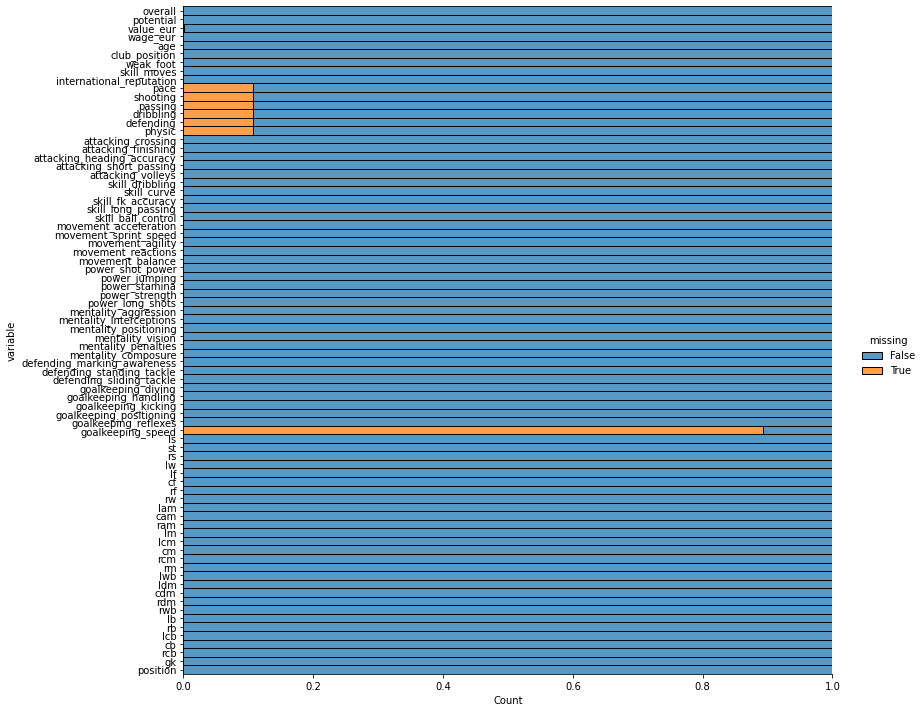

In [11]:
# Let's check missing values

sns.displot(
    data=df_train.isna().melt(value_name="missing"),
    y="variable",
    hue="missing",
    multiple="fill",
    height=10,
    aspect=1.2
)
plt.show()

As we analyze the missing values, we can see that goalkeeping speed has high percentage of missing values. Hence we can also drop the feature. But for the other missing values related to pace, shooting, passing, dribbling, defending and physic, mostly this data is not available for goal keepers. So, instead of dropping the records related to goal keepers, we will keep a constant value of 40 for all the goal keepers, as the intuitively thinking since these goal keepers are professional players, almost all of them would have a score of atleast 40. There is one missing value under value_eur. It is highly possible that the player has decided to retire and hence no value is assigned. So, we will just drop this record as an outlier.

In [12]:
# dropping the feature 'goalkeeping_speed'
df_train.drop(columns=['goalkeeping_speed'], inplace=True)

In [13]:
# data imputation for the features 'pace', 'shooting', 'passing', 'dribbling', 'defending' and 'physic' with a constant value of 40
for features in ['pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic']:
    df_train[features].fillna(40, inplace=True)

In [14]:
# Consider all other missing values as outliers, so just drop them
df_train.dropna(inplace=True)

In [15]:
# Let's separate the labels from training data
labels = df_train['position']
df_train.drop(columns=['position'], inplace=True)

In [16]:
print(df_train.shape)

(1583, 76)


Next, for the feature `club_position` which indicates the playing position of the player for the club, we will keep this feature, but since it is a categorical feature, we will apply one-hot encoding. Let's first check the count of the possible playing positions.

In [17]:
len(df_train['club_position'].value_counts())

29

In [18]:
# One-Hot Encoding
def encode_features(df, features):
    '''
    Method for one-hot encoding all selected categorical fields
    '''
    for f in features:
        if(f in df.columns):
            encoded = pd.get_dummies(df[f])
            encoded = encoded.add_prefix(f + '_')
            df = pd.concat([df, encoded], axis=1)
        else:
            print('Feature not found')
            return df
        
    df.drop(columns=features, inplace = True)
    
    return df

encoded_train = encode_features(df_train, features = ['club_position'])
encoded_train.shape

(1583, 104)

In [19]:
encoded_train.head()

,overall,potential,value_eur,wage_eur,age,weak_foot,skill_moves,international_reputation,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,rb,lcb,cb,rcb,gk,club_position_CAM,club_position_CB,club_position_CDM,club_position_CF,club_position_CM,club_position_GK,club_position_LAM,club_position_LB,club_position_LCB,club_position_LCM,club_position_LDM,club_position_LF,club_position_LM,club_position_LS,club_position_LW,club_position_LWB,club_position_RAM,club_position_RB,club_position_RCB,club_position_RCM,club_position_RDM,club_position_RES,club_position_RF,club_position_RM,club_position_RS,club_position_RW,club_position_RWB,club_position_ST,club_position_SUB
0,93,93,103500000.0,560000.0,33,4,4,5,85.0,92.0,91.0,95.0,38.0,65.0,85,95,70,91,88,96,93,94,91,96,91,80,91,94,95,86,68,72,69,94,44,40,93,95,75,96,32,35,24,6,11,15,14,8,92,92,92,92,93,93,93,92,93,93,93,93,90,90,90,93,69,68,68,68,69,65,65,55,55,55,22,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,92,92,63000000.0,220000.0,35,4,5,5,89.0,93.0,81.0,89.0,35.0,77.0,84,95,90,82,86,88,81,76,77,92,87,91,87,95,71,94,95,84,78,93,63,29,95,82,84,95,28,32,24,7,11,15,14,11,92,92,92,89,91,91,91,89,91,91,91,91,84,84,84,91,68,64,64,64,68,64,64,57,57,57,23,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,91,91,111000000.0,240000.0,31,4,4,4,78.0,91.0,78.0,85.0,43.0,82.0,71,94,85,84,89,85,79,85,70,88,77,78,77,93,82,89,84,76,86,85,81,49,94,79,88,88,35,42,19,15,6,12,8,10,91,91,91,85,87,87,87,85,88,88,88,86,82,82,82,86,67,68,68,68,67,64,64,63,63,63,22,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,91,91,132000000.0,270000.0,28,5,5,5,91.0,85.0,86.0,94.0,36.0,59.0,85,87,62,87,87,95,88,89,81,95,94,89,96,91,83,80,62,81,50,84,51,36,87,90,92,93,35,30,29,9,9,15,15,11,87,87,87,90,89,89,89,90,91,91,91,91,86,86,86,91,70,65,65,65,70,65,65,52,52,52,23,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,91,91,129000000.0,370000.0,29,5,4,4,76.0,86.0,93.0,88.0,64.0,78.0,94,82,55,94,82,88,85,83,93,92,77,76,78,91,76,91,63,89,74,91,76,66,88,94,84,91,68,65,53,15,13,5,10,13,86,86,86,88,88,88,88,88,91,91,91,91,91,91,91,91,82,83,83,83,82,78,78,72,72,72,24,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


Now, we have 104 features in total, which is actually alot! Also, data scaling and normalization definitely would have helped to get a better model, but we will avoid that, as like other exercises covered in previous chapters, the goal is to come up with a model explainability method and not with an highly accurate model! Let's proceed with training the model.

### Training the model

Now, let's use AutoML model from H2O. The process of creating AutoML model in H2O is slightly different and please note that it is not scikit learn compatible. Also, the H2O implementation requires it to have its own H2O frame. Now, let's get started!

In [20]:
x_train,x_valid,y_train,y_valid = train_test_split(encoded_train,labels,test_size=0.2,random_state=123)

In [21]:
# Start the H2O cluster (locally) - Don't forget this step
h2o.init()
h2o.no_progress() # The progress bar for each H2O step can be annoying, so disabling it.

# Run AutoML for 20 base models
aml = H2OAutoML(max_models=20, seed=1)

Checking whether there is an H2O instance running at http://localhost:54321 . connected.


H2O_cluster_uptime:,14 hours 50 mins
H2O_cluster_timezone:,Europe/Paris
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.36.0.3
H2O_cluster_version_age:,1 month and 2 days
H2O_cluster_name:,H2O_from_python_Aditya_Bhattacharya_55qn1q
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,2.972 Gb
H2O_cluster_total_cores:,12
H2O_cluster_allowed_cores:,12
H2O_cluster_status:,"locked, healthy"


In [22]:
train = x_train.copy()
valid = x_valid.copy()
train["position"] = y_train
valid["position"] = y_valid
x = list(train.columns)
y = "position"

training_frame = h2o.H2OFrame(train)
validation_frame=h2o.H2OFrame(valid) 

# training the automl model
aml.train(x=x, y=y, training_frame=training_frame, validation_frame=validation_frame)


10:10:33.572: User specified a validation frame with cross-validation still enabled. Please note that the models will still be validated using cross-validation only, the validation frame will be used to provide purely informative validation metrics on the trained models.
10:10:33.572: AutoML: XGBoost is not available; skipping it.
10:10:33.572: Step 'best_of_family_xgboost' not defined in provider 'StackedEnsemble': skipping it.
10:10:33.572: Step 'all_xgboost' not defined in provider 'StackedEnsemble': skipping it.
10:10:33.572: _train param, Dropping bad and constant columns: [club_position_LAM]
10:10:34.589: _train param, Dropping bad and constant columns: [club_position_LAM]
10:10:35.594: _train param, Dropping unused columns: [club_position_LAM]
10:10:36.609: _train param, Dropping bad and constant columns: [club_position_LAM]


10:10:46.881: _train param, Dropping bad and constant columns: [club_position_LAM]
10:10:47.894: _train param, Dropping bad and constant columns: [club_p

In [23]:
# Get the AutoML Leaderboard
lb = aml.leaderboard
lb.head(rows=lb.nrows)

model_id,mean_residual_deviance,rmse,mse,mae,rmsle
StackedEnsemble_BestOfFamily_3_AutoML_4_20220319_101033,5.87259,2.42334,5.87259,2.00974,0.453783
StackedEnsemble_AllModels_1_AutoML_4_20220319_101033,5.87371,2.42357,5.87371,2.00712,0.453245
StackedEnsemble_BestOfFamily_5_AutoML_4_20220319_101033,5.88873,2.42667,5.88873,2.00583,0.454244
StackedEnsemble_AllModels_6_AutoML_4_20220319_101033,5.88983,2.4269,5.88983,2.0092,0.453852
StackedEnsemble_AllModels_4_AutoML_4_20220319_101033,5.8992,2.42883,5.8992,2.00626,0.45333
StackedEnsemble_BestOfFamily_2_AutoML_4_20220319_101033,5.90613,2.43025,5.90613,2.01717,0.455108
StackedEnsemble_AllModels_2_AutoML_4_20220319_101033,5.90837,2.43071,5.90837,2.01115,0.454293
StackedEnsemble_BestOfFamily_7_AutoML_4_20220319_101033,5.9123,2.43152,5.9123,2.00828,0.455025
StackedEnsemble_AllModels_3_AutoML_4_20220319_101033,5.91618,2.43232,5.91618,2.01432,0.454981
StackedEnsemble_BestOfFamily_4_AutoML_4_20220319_101033,5.91977,2.43306,5.91977,2.01234,0.454988


In [24]:
# View all automl model performance
lb = h2o.automl.get_leaderboard(aml, extra_columns = "ALL")
lb

model_id,mean_residual_deviance,rmse,mse,mae,rmsle,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_BestOfFamily_3_AutoML_4_20220319_101033,5.87259,2.42334,5.87259,2.00974,0.453783,382,0.021356,StackedEnsemble
StackedEnsemble_AllModels_1_AutoML_4_20220319_101033,5.87371,2.42357,5.87371,2.00712,0.453245,363,0.017675,StackedEnsemble
StackedEnsemble_BestOfFamily_5_AutoML_4_20220319_101033,5.88873,2.42667,5.88873,2.00583,0.454244,471,0.02449,StackedEnsemble
StackedEnsemble_AllModels_6_AutoML_4_20220319_101033,5.88983,2.4269,5.88983,2.0092,0.453852,614,0.048311,StackedEnsemble
StackedEnsemble_AllModels_4_AutoML_4_20220319_101033,5.8992,2.42883,5.8992,2.00626,0.45333,540,0.046661,StackedEnsemble
StackedEnsemble_BestOfFamily_2_AutoML_4_20220319_101033,5.90613,2.43025,5.90613,2.01717,0.455108,357,0.01563,StackedEnsemble
StackedEnsemble_AllModels_2_AutoML_4_20220319_101033,5.90837,2.43071,5.90837,2.01115,0.454293,375,0.020266,StackedEnsemble
StackedEnsemble_BestOfFamily_7_AutoML_4_20220319_101033,5.9123,2.43152,5.9123,2.00828,0.455025,488,0.019567,StackedEnsemble
StackedEnsemble_AllModels_3_AutoML_4_20220319_101033,5.91618,2.43232,5.91618,2.01432,0.454981,396,0.025623,StackedEnsemble
StackedEnsemble_BestOfFamily_4_AutoML_4_20220319_101033,5.91977,2.43306,5.91977,2.01234,0.454988,361,0.015139,StackedEnsemble


In [25]:
# get the best or the leader model
model = aml.get_best_model()

### Model evaluation on unseen data

In [26]:
df_test = pd.read_csv('datasets/FIFA_Club_Position/fifa_league_22_test.csv')

def predict_club_position(df_test, model, club_name, num_player = 10):
    '''
    Predict club position from player quality
    '''
    df_test = df_test[df_test['club_name'] == club_name].head(num_player)
    # display.display(df_test)
    df_test.drop(columns=features_to_drop, inplace=True)
    df_test.drop(columns=['goalkeeping_speed'], inplace=True)
    for features in ['pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic']:
            df_test[features].fillna(40, inplace=True)
    encoded_test = encode_features(df_test, features = ['club_position'])
    test_frame=h2o.H2OFrame(encoded_test)
    preds = model.predict(test_frame)
    out_position = preds.as_data_frame()['predict'].tolist()
    return np.median(out_position)

In [27]:
position = predict_club_position(df_test, model, club_name = 'Manchester United', num_player = 10)
print(f"Predicted position is: {round(position)}")

Predicted position is: 2


In [28]:
# Now let's get top clubs from every league according to our model for 2021-2022 season

def get_top_clubs(df_test, model, num_player = 15):
    '''
    Get top clubs across all leagues available in the dataset
    '''
    all_leagues = list(df_test['league_name'].unique())
    for league in all_leagues:
        df = df_test[df_test['league_name'] == league]
        all_clubs = list(df['club_name'].unique())
        club_pos_list = []
        for club in all_clubs:
            predicted_pos = predict_club_position(df, model, club_name = club, num_player = num_player)
            club_pos_list.append((club, predicted_pos))
        club_pos_df = pd.DataFrame(club_pos_list, columns = ['Club', 'Position'])
        club_pos_df['Position'] = club_pos_df['Position'].rank()
        club_pos_df = club_pos_df.sort_values(by=['Position'])
        print('---------------------------------------------------------------')
        print(f'Predicted positions for {league}')
        print('---------------------------------------------------------------')
        display.display(club_pos_df)

In [29]:
get_top_clubs(df_test, model)

---------------------------------------------------------------
Predicted positions for French Ligue 1
---------------------------------------------------------------


,Club,Position
0,Paris Saint-Germain,1.0
1,AS Monaco,2.0
2,Olympique Lyonnais,3.0
4,Olympique de Marseille,4.0
3,LOSC Lille,5.0
7,Stade Rennais FC,6.0
5,OGC Nice,7.0
9,Racing Club de Lens,8.0
6,Montpellier Hérault SC,9.0
8,FC Metz,10.0


---------------------------------------------------------------
Predicted positions for German 1. Bundesliga
---------------------------------------------------------------


,Club,Position
0,FC Bayern München,1.0
1,Borussia Dortmund,2.0
4,RB Leipzig,3.0
2,VfL Wolfsburg,4.0
6,Bayer 04 Leverkusen,5.0
3,Borussia Mönchengladbach,6.0
5,Eintracht Frankfurt,7.0
8,Sport-Club Freiburg,8.0
7,1. FC Union Berlin,9.0
9,VfB Stuttgart,10.0


---------------------------------------------------------------
Predicted positions for English Premier League
---------------------------------------------------------------


,Club,Position
1,Manchester City,1.0
4,Liverpool,2.0
0,Manchester United,3.0
3,Chelsea,4.0
2,Tottenham Hotspur,5.0
5,Leicester City,6.0
8,West Ham United,7.0
6,Arsenal,8.0
9,Leeds United,9.0
7,Everton,10.0


---------------------------------------------------------------
Predicted positions for Spain Primera Division
---------------------------------------------------------------


,Club,Position
2,Real Madrid CF,1.0
1,FC Barcelona,2.0
0,Atlético de Madrid,3.0
4,Sevilla FC,4.0
5,Real Sociedad,5.0
3,Villarreal CF,6.0
8,Athletic Club de Bilbao,7.0
7,Real Betis Balompié,8.0
9,Granada CF,9.0
6,RC Celta de Vigo,10.0


---------------------------------------------------------------
Predicted positions for Italian Serie A
---------------------------------------------------------------


,Club,Position
2,Inter,1.0
0,Juventus,2.0
4,AC Milan,3.0
3,Napoli,4.0
5,Atalanta,5.0
6,Roma,6.0
1,Lazio,7.0
7,U.S. Sassuolo Calcio,8.0
9,Hellas Verona,9.0
8,U.C. Sampdoria,10.0


So, based on the data about the quality of players, the best AutoML model has predicted the club position for the top football leagues of the world. In the real world setting, obviously there are much more variable that needs to be considered, but I think the results from the model is pretty reasonable. Now, let's use H2O model explainability to explain the model results. You can take a look at this document before you proceed: https://docs.h2o.ai/h2o/latest-stable/h2o-docs/explain.html#

### Model Explainability using H2O Explainers

We will use the model explanation methods available in H2O for the best model. H2O provides option for global explanation, as well as for local explanation. The following are the explanation methods covered in H2O:
- Leaderboard (compare all models)
- Confusion Matrix for Leader Model (classification only)
- Residual Analysis for Leader Model (regression only)
- Variable Importance of Top Base (non-Stacked) Model
- Variable Importance Heatmap (compare all non-Stacked models)
- Model Correlation Heatmap (compare all models)
- SHAP Summary of Top Tree-based Model (TreeSHAP)
- Partial Dependence (PD) Multi Plots (compare all models)
- Individual Conditional Expectation (ICE) Plots
More detailed explanation for the approach is provided in the H2O documentations - https://docs.h2o.ai/h2o/latest-stable/h2o-docs/explain.html

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,mean_residual_deviance,rmse,mse,mae,rmsle,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_BestOfFamily_3_AutoML_4_20220319_101033,5.87259,2.42334,5.87259,2.00974,0.453783,382,0.021356,StackedEnsemble
StackedEnsemble_AllModels_1_AutoML_4_20220319_101033,5.87371,2.42357,5.87371,2.00712,0.453245,363,0.017675,StackedEnsemble
StackedEnsemble_BestOfFamily_5_AutoML_4_20220319_101033,5.88873,2.42667,5.88873,2.00583,0.454244,471,0.02449,StackedEnsemble
StackedEnsemble_AllModels_6_AutoML_4_20220319_101033,5.88983,2.4269,5.88983,2.0092,0.453852,614,0.048311,StackedEnsemble
StackedEnsemble_AllModels_4_AutoML_4_20220319_101033,5.8992,2.42883,5.8992,2.00626,0.45333,540,0.046661,StackedEnsemble
StackedEnsemble_BestOfFamily_2_AutoML_4_20220319_101033,5.90613,2.43025,5.90613,2.01717,0.455108,357,0.01563,StackedEnsemble
StackedEnsemble_AllModels_2_AutoML_4_20220319_101033,5.90837,2.43071,5.90837,2.01115,0.454293,375,0.020266,StackedEnsemble
StackedEnsemble_BestOfFamily_7_AutoML_4_20220319_101033,5.9123,2.43152,5.9123,2.00828,0.455025,488,0.019567,StackedEnsemble
StackedEnsemble_AllModels_3_AutoML_4_20220319_101033,5.91618,2.43232,5.91618,2.01432,0.454981,396,0.025623,StackedEnsemble
StackedEnsemble_BestOfFamily_4_AutoML_4_20220319_101033,5.91977,2.43306,5.91977,2.01234,0.454988,361,0.015139,StackedEnsemble


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

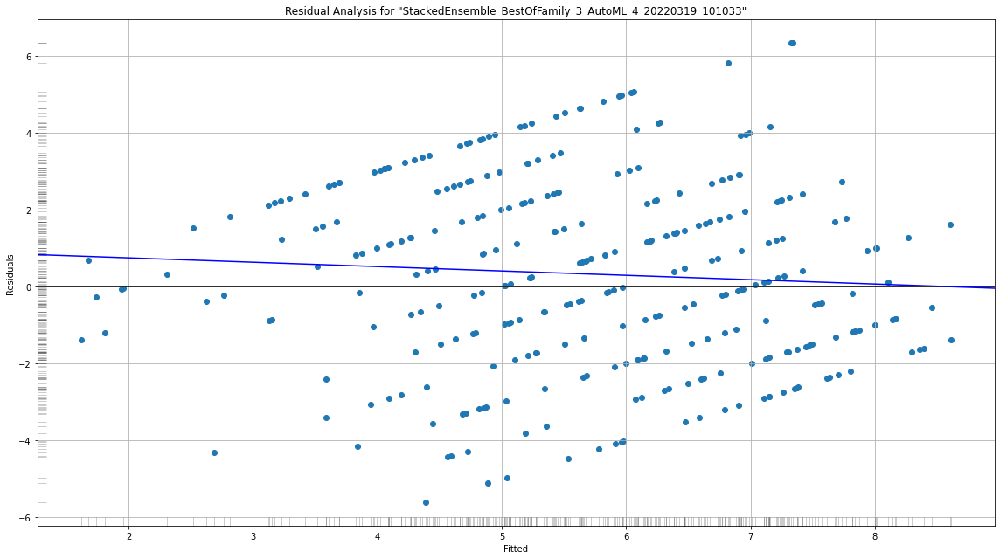

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

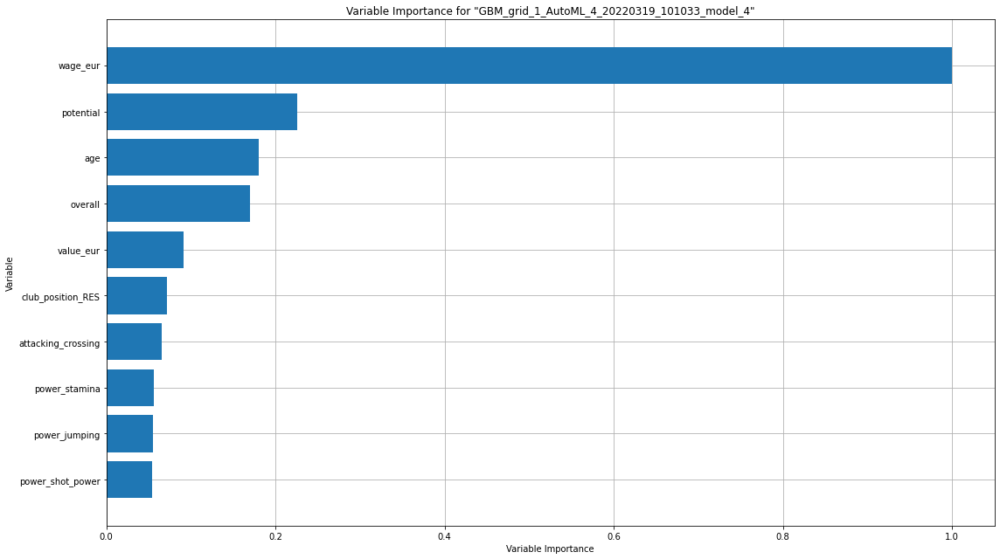

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

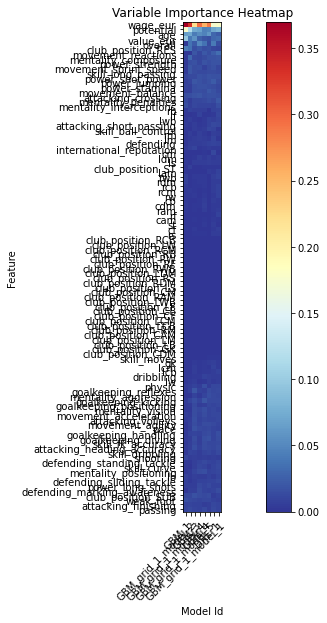

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

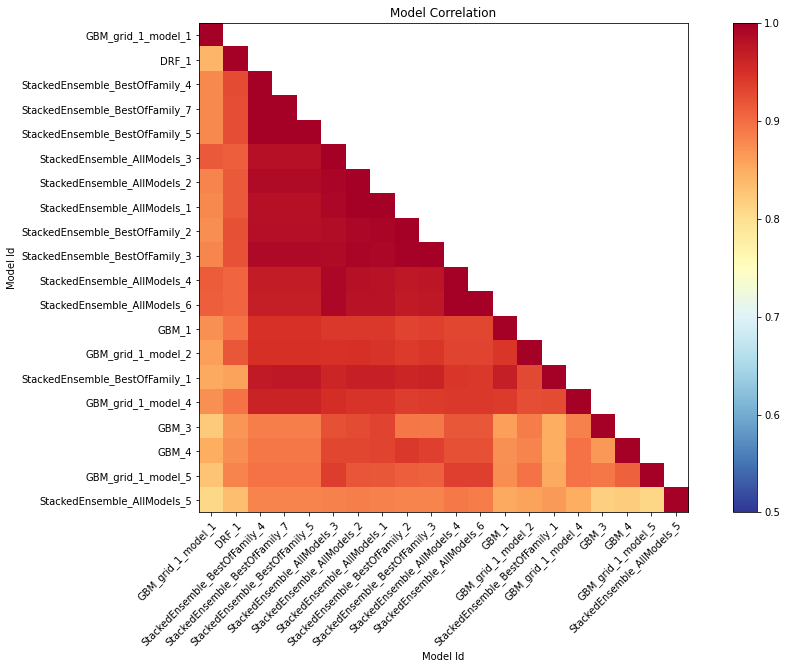

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

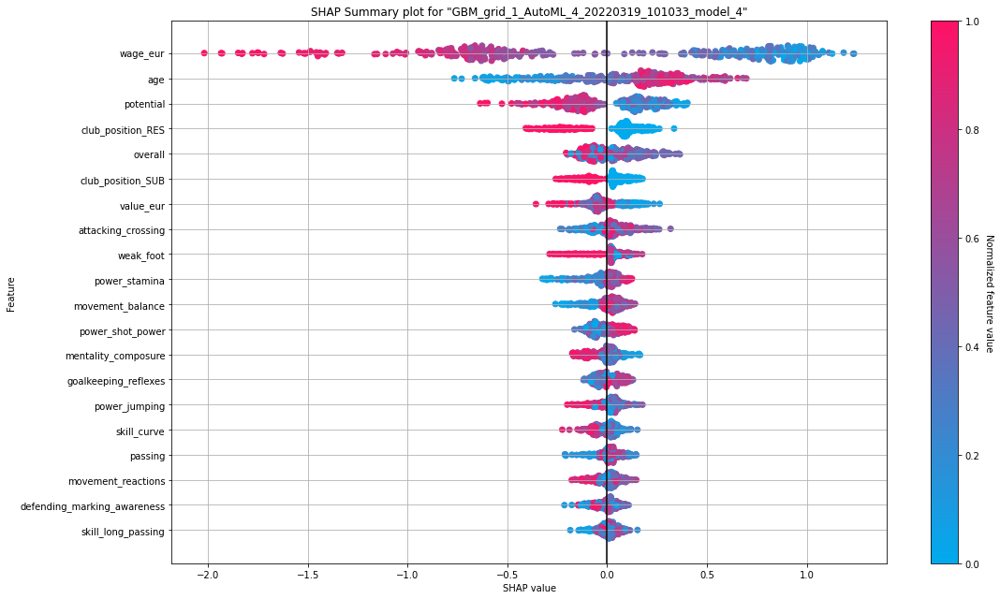

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

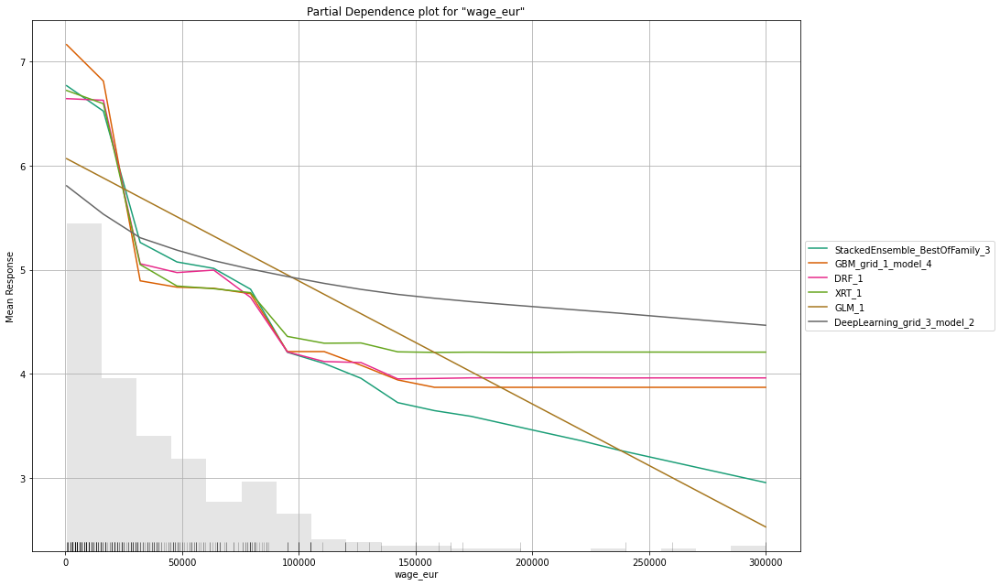

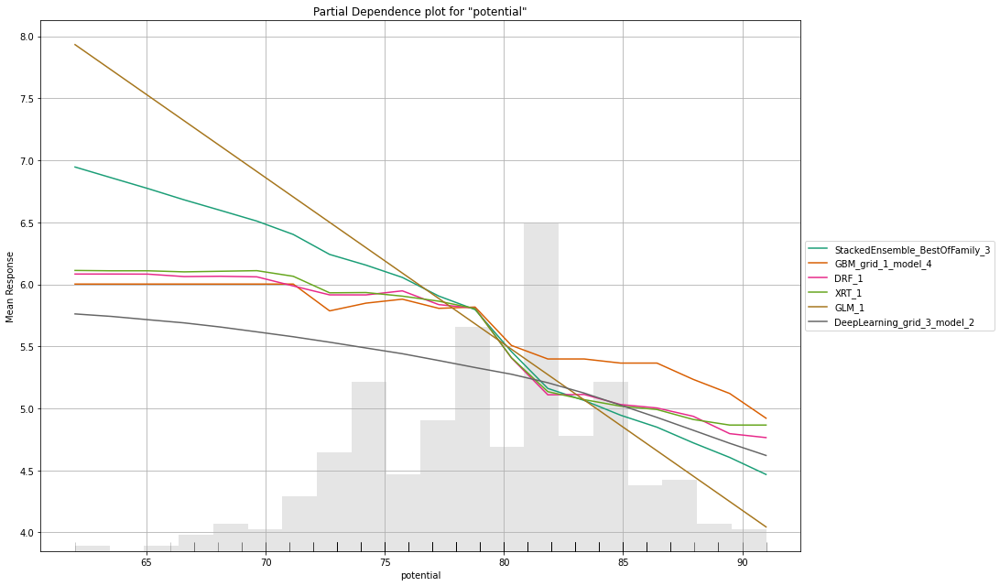

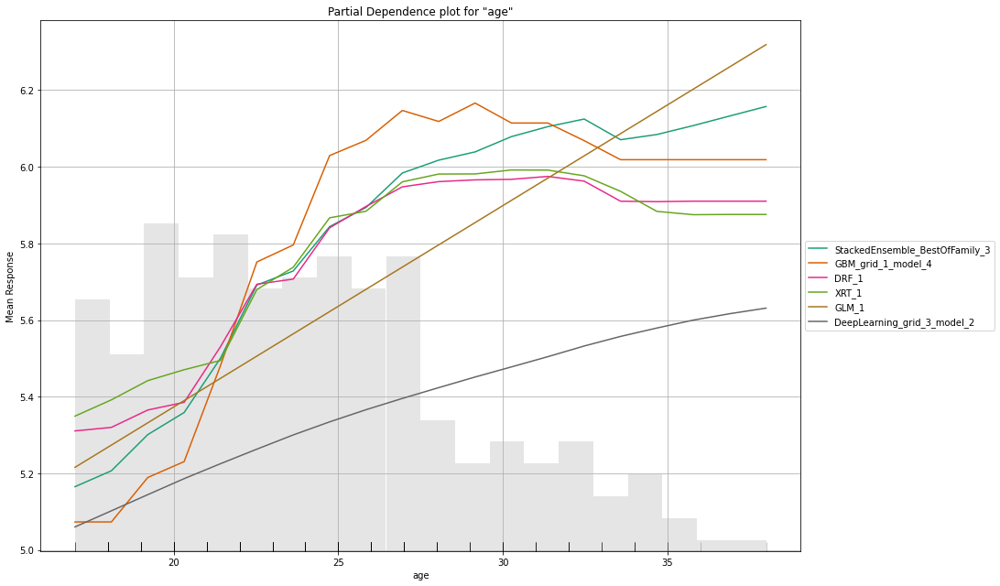

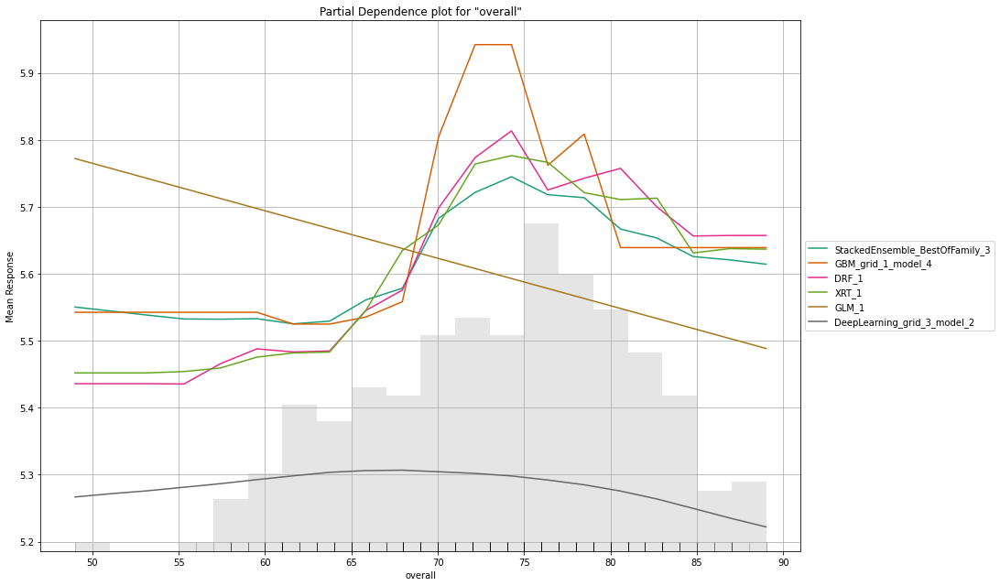

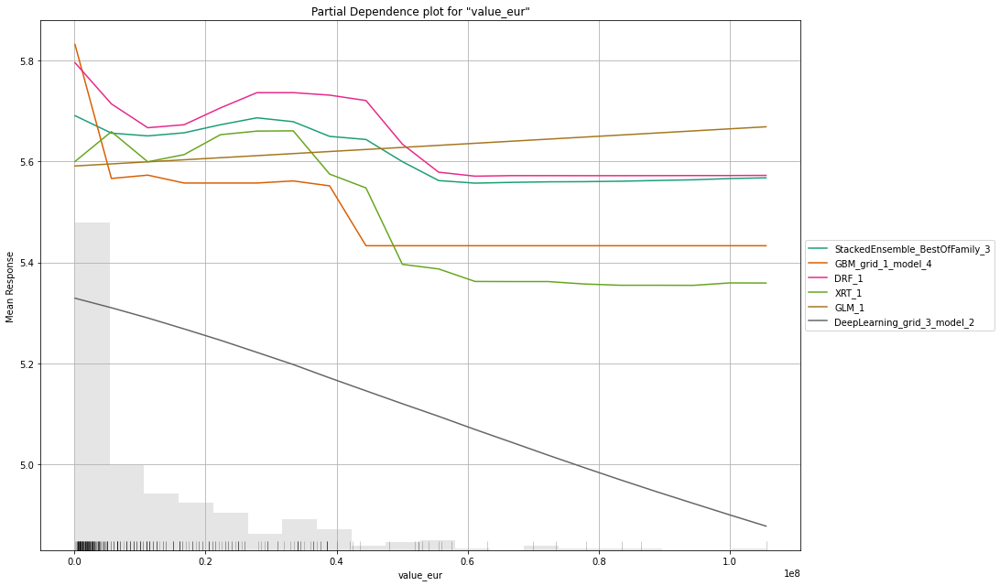

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

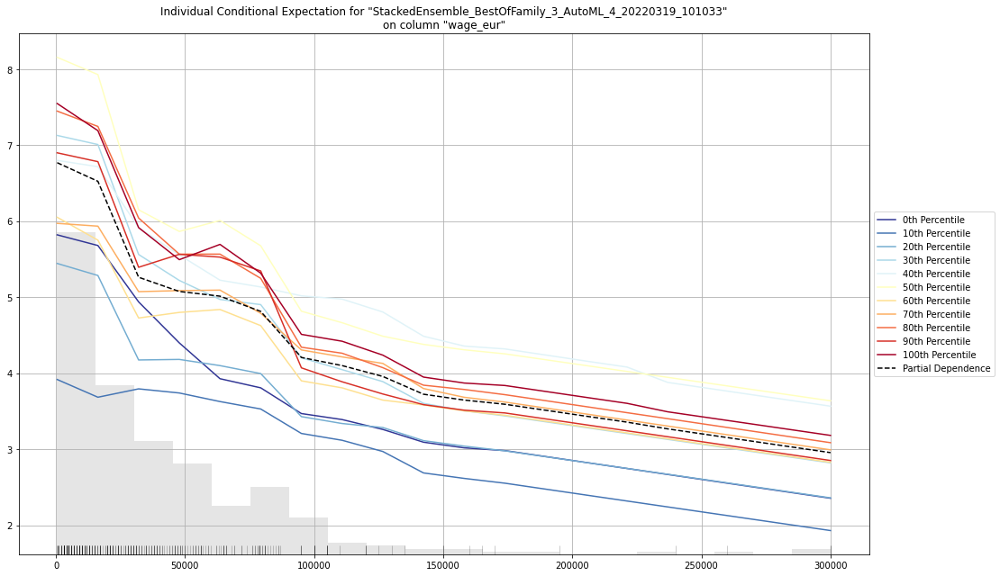

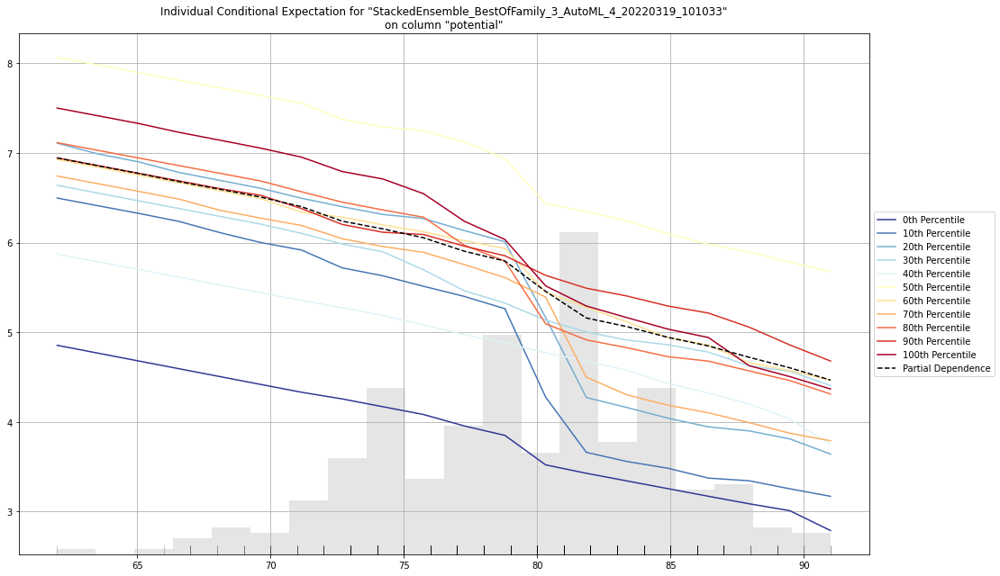

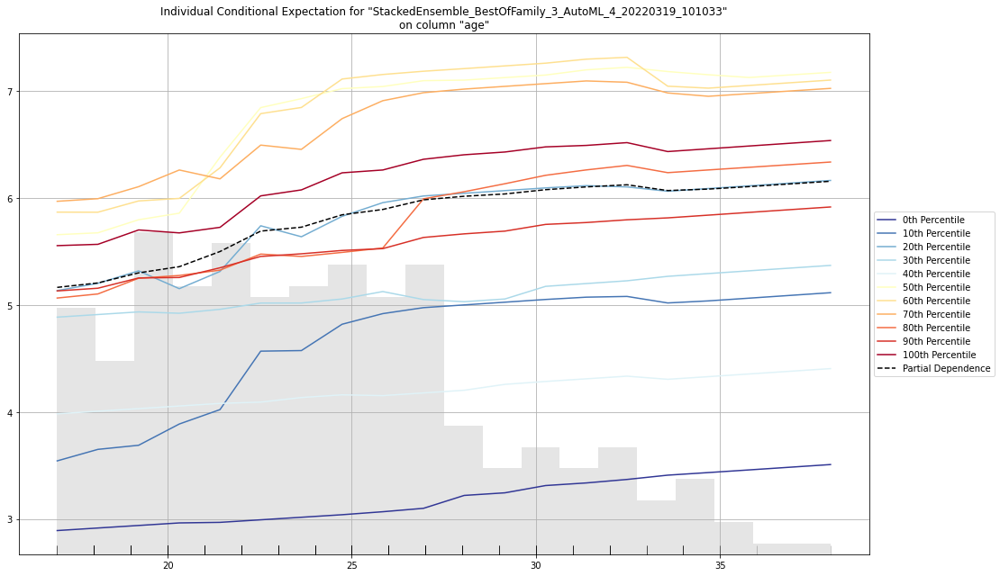

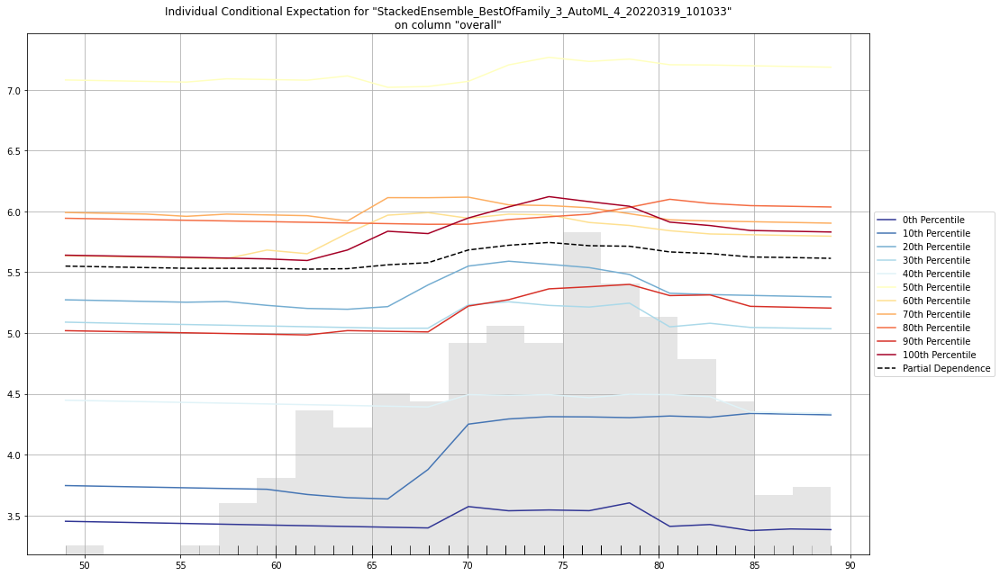

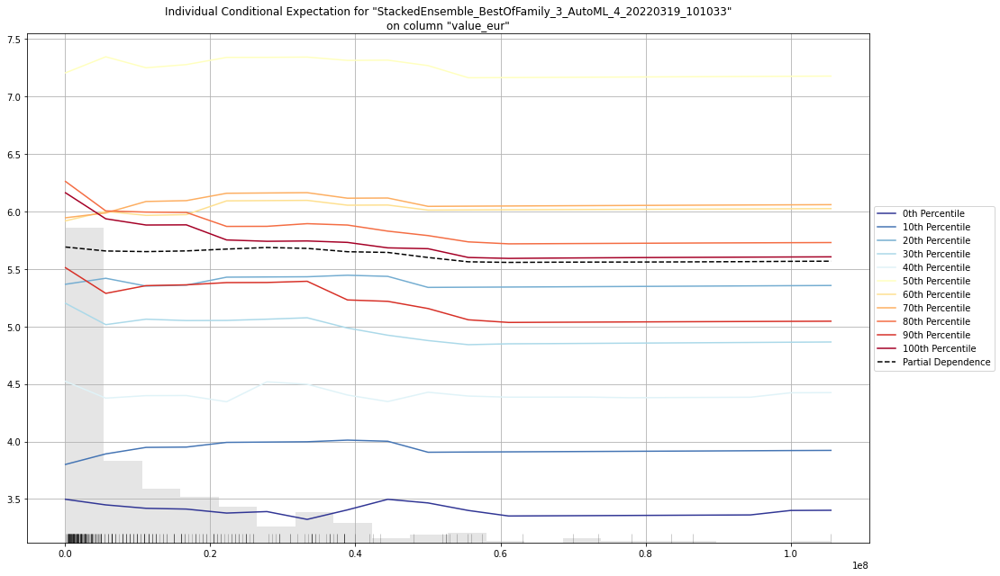

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,mean_residual_deviance,rmse,mse,mae,rmsle,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_BestOfFamily_3_AutoML_4_20220319_101033,5.87259,2.42334,5.87259,2.00974,0.453783,382,0.021356,StackedEnsemble
StackedEnsemble_AllModels_1_AutoML_4_20220319_101033,5.87371,2.42357,5.87371,2.00712,0.453245,363,0.017675,StackedEnsemble
StackedEnsemble_BestOfFamily_5_AutoML_4_20220319_101033,5.88873,2.42667,5.88873,2.00583,0.454244,471,0.02449,StackedEnsemble
StackedEnsemble_AllModels_6_AutoML_4_20220319_101033,5.88983,2.4269,5.88983,2.0092,0.453852,614,0.048311,StackedEnsemble
StackedEnsemble_AllModels_4_AutoML_4_20220319_101033,5.8992,2.42883,5.8992,2.00626,0.45333,540,0.046661,StackedEnsemble
StackedEnsemble_BestOfFamily_2_AutoML_4_20220319_101033,5.90613,2.43025,5.90613,2.01717,0.455108,357,0.01563,StackedEnsemble
StackedEnsemble_AllModels_2_AutoML_4_20220319_101033,5.90837,2.43071,5.90837,2.01115,0.454293,375,0.020266,StackedEnsemble
StackedEnsemble_BestOfFamily_7_AutoML_4_20220319_101033,5.9123,2.43152,5.9123,2.00828,0.455025,488,0.019567,StackedEnsemble
StackedEnsemble_AllModels_3_AutoML_4_20220319_101033,5.91618,2.43232,5.91618,2.01432,0.454981,396,0.025623,StackedEnsemble
StackedEnsemble_BestOfFamily_4_AutoML_4_20220319_101033,5.91977,2.43306,5.91977,2.01234,0.454988,361,0.015139,StackedEnsemble


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

In [46]:
aml.explain(validation_frame)

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

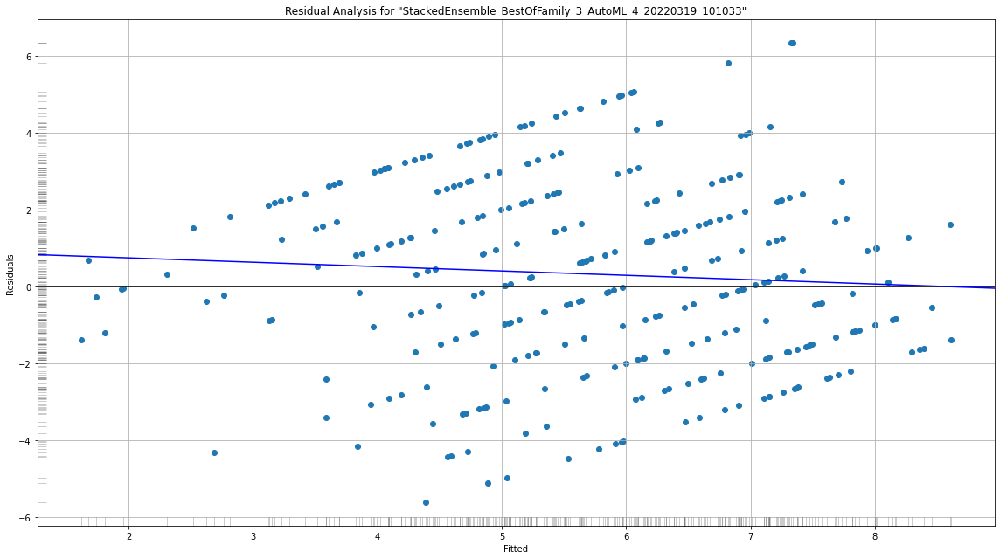

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

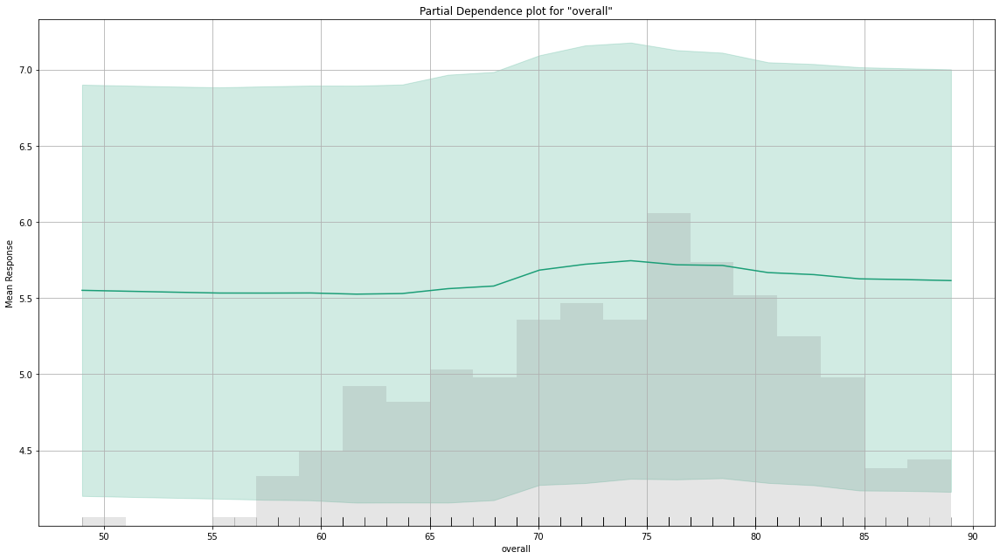

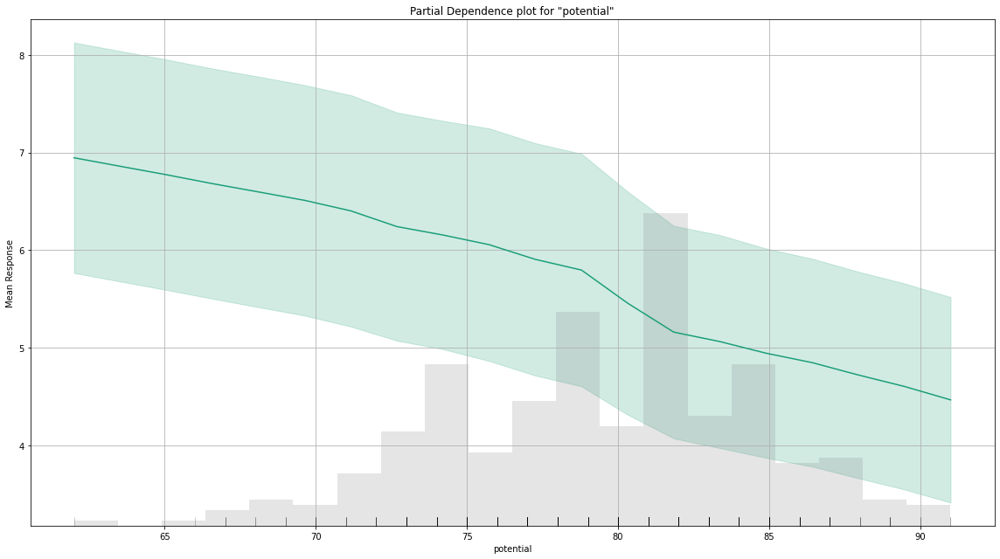

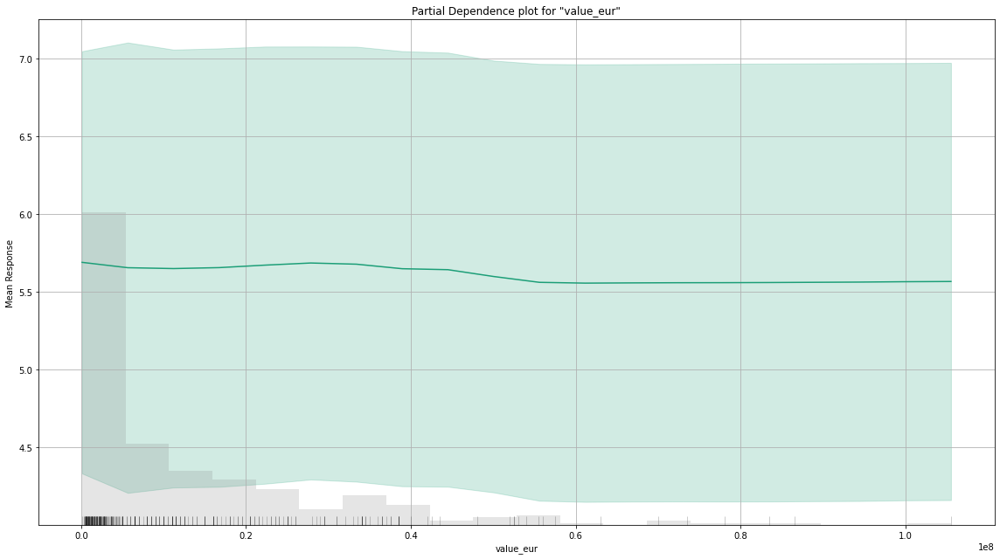

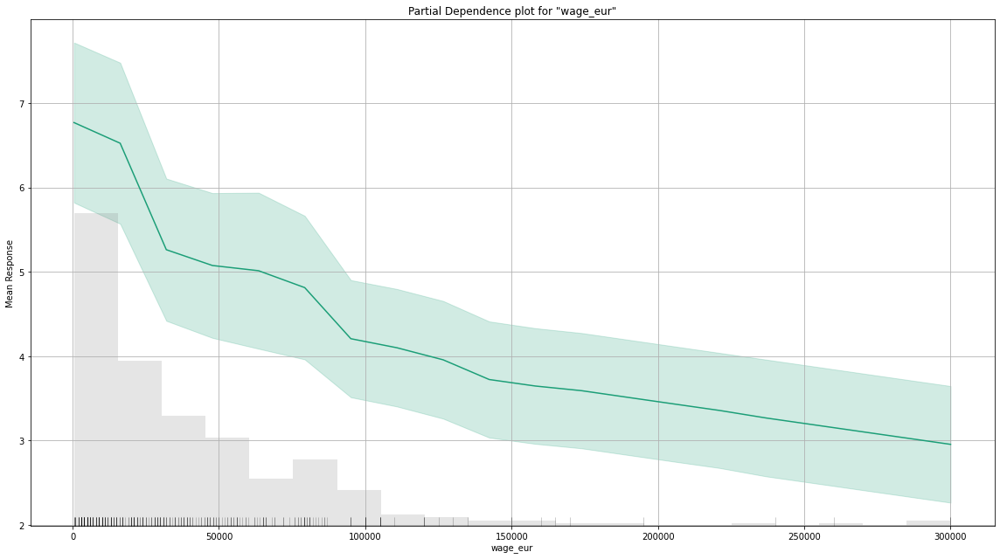

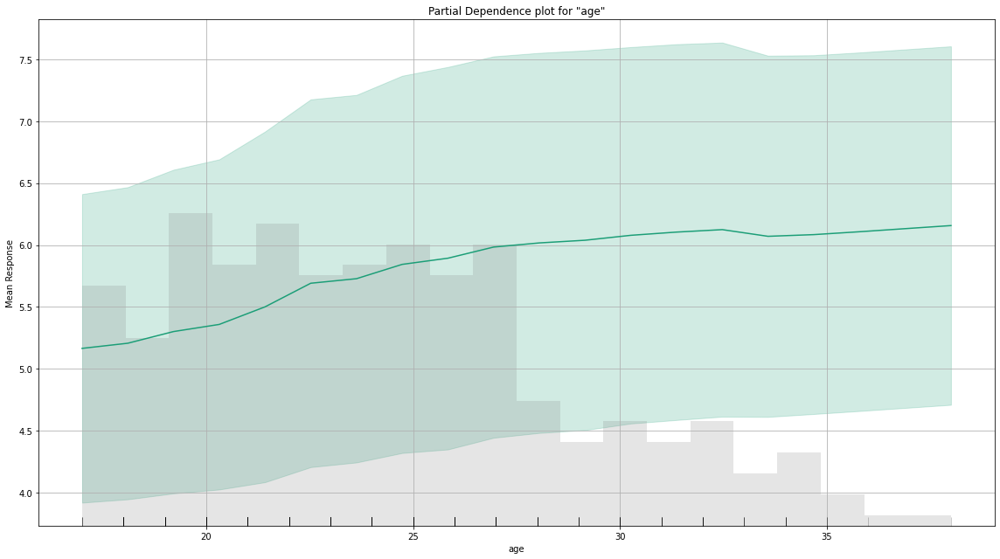

...

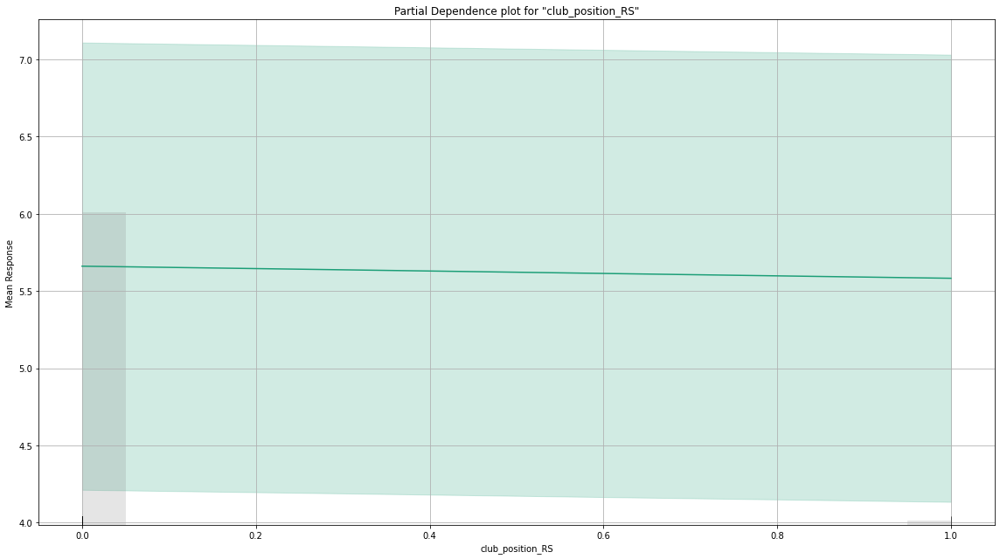

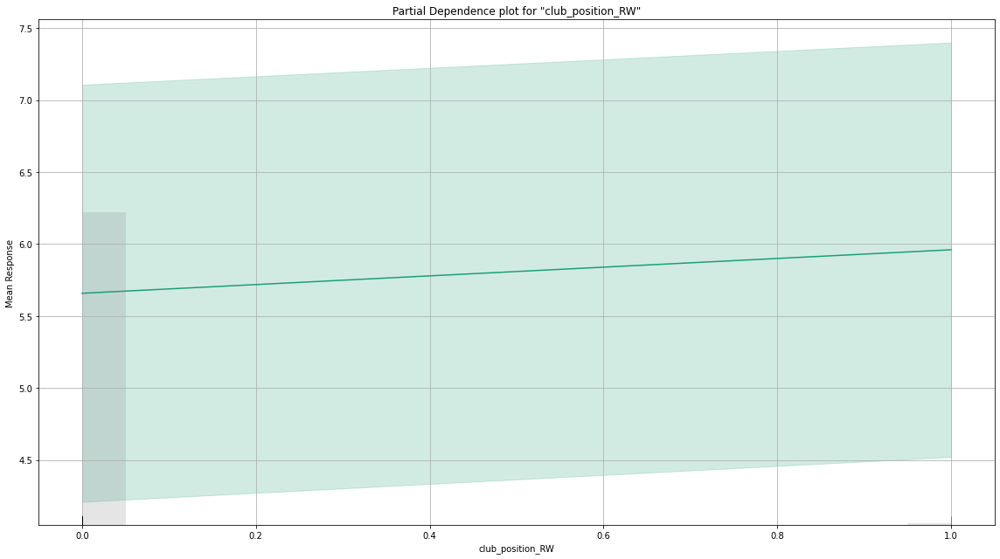

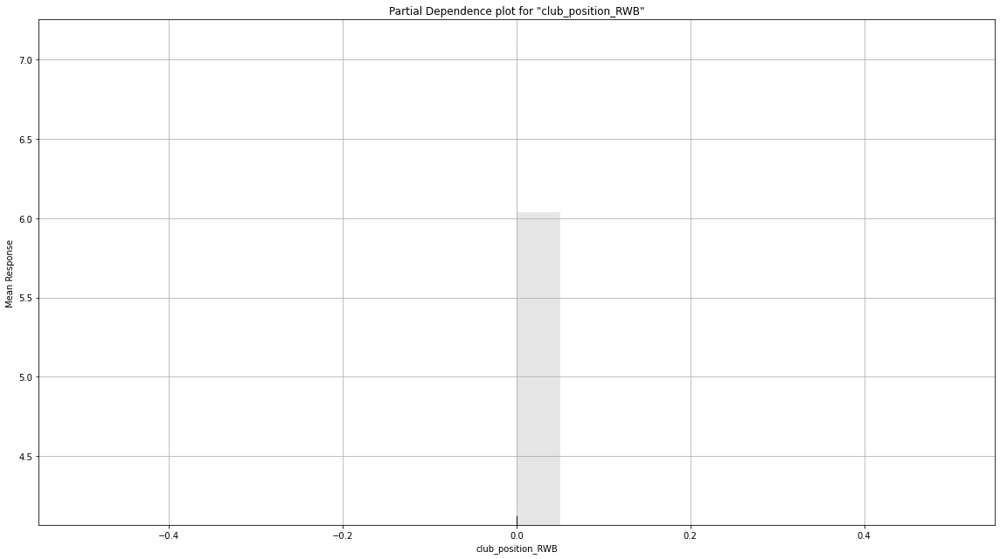

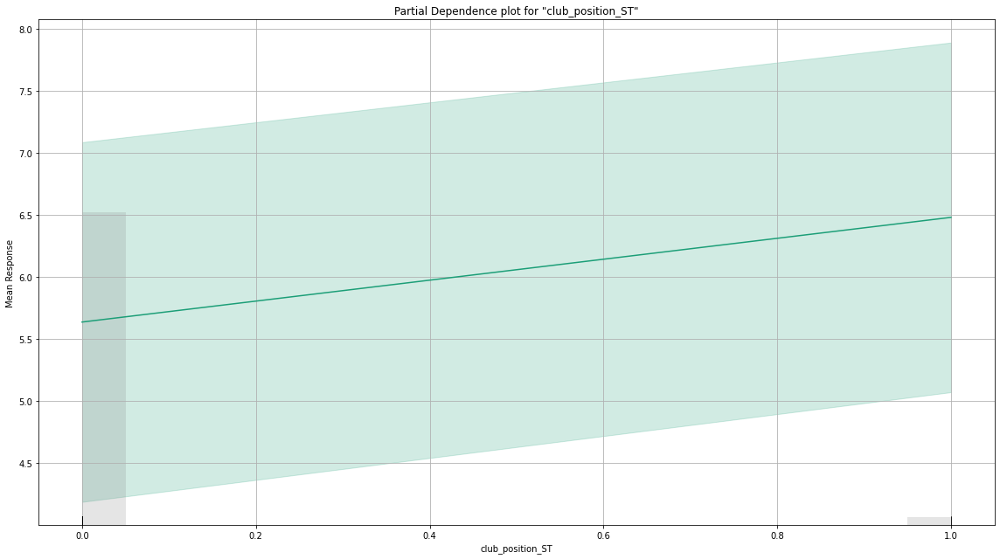

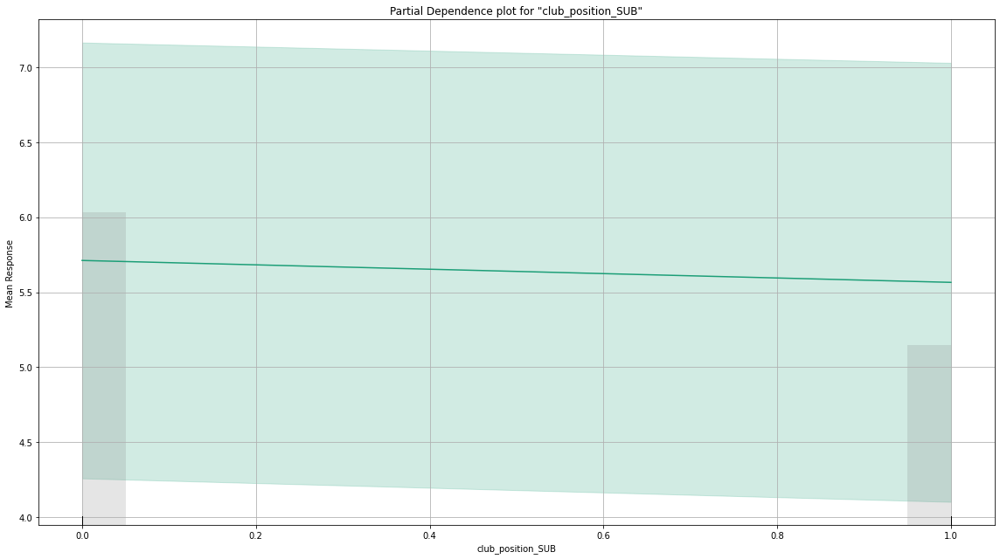

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

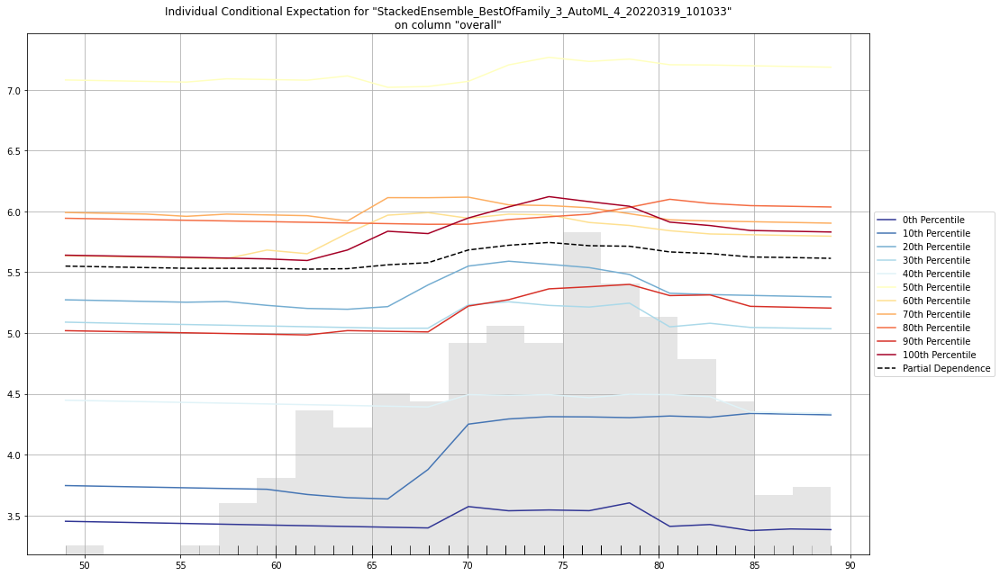

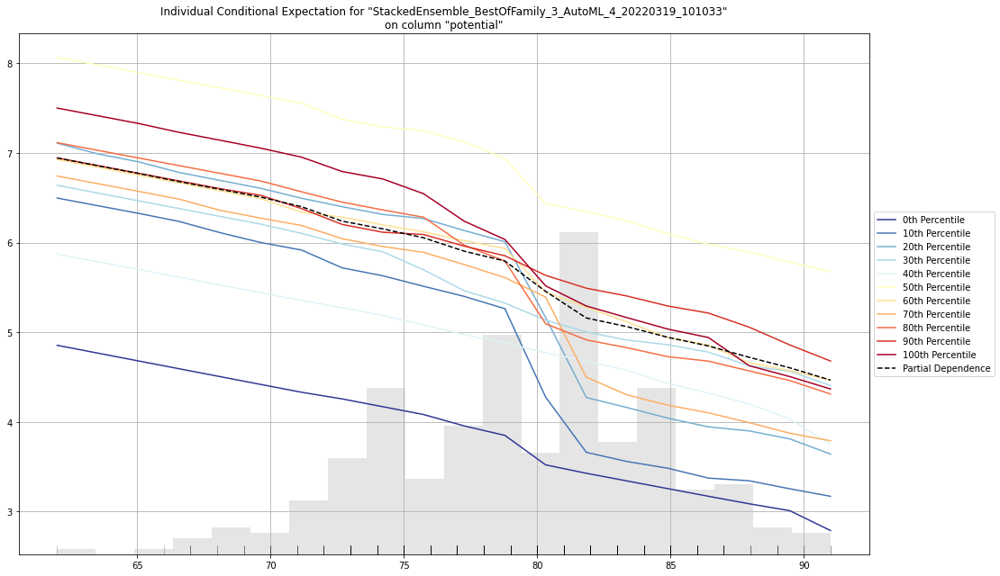

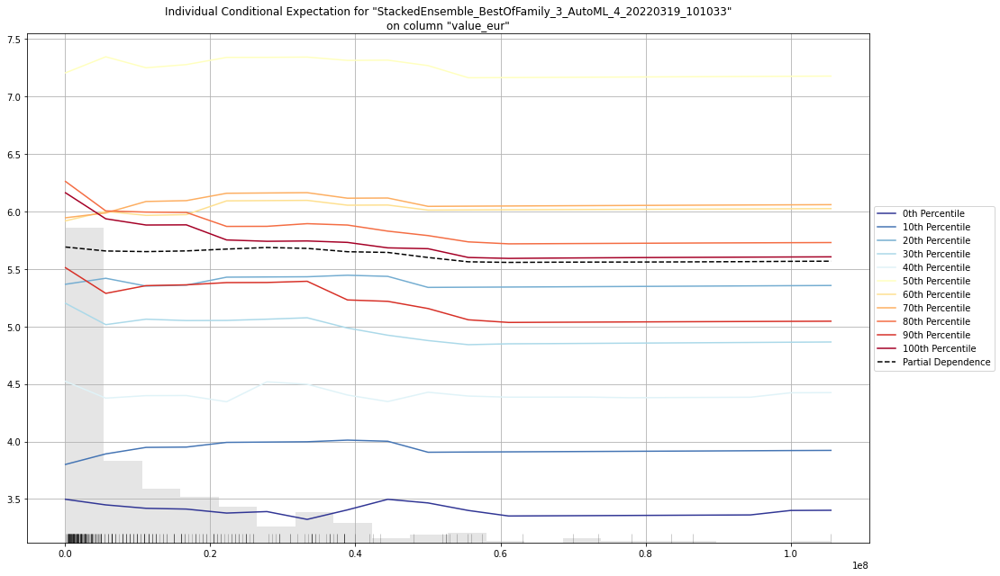

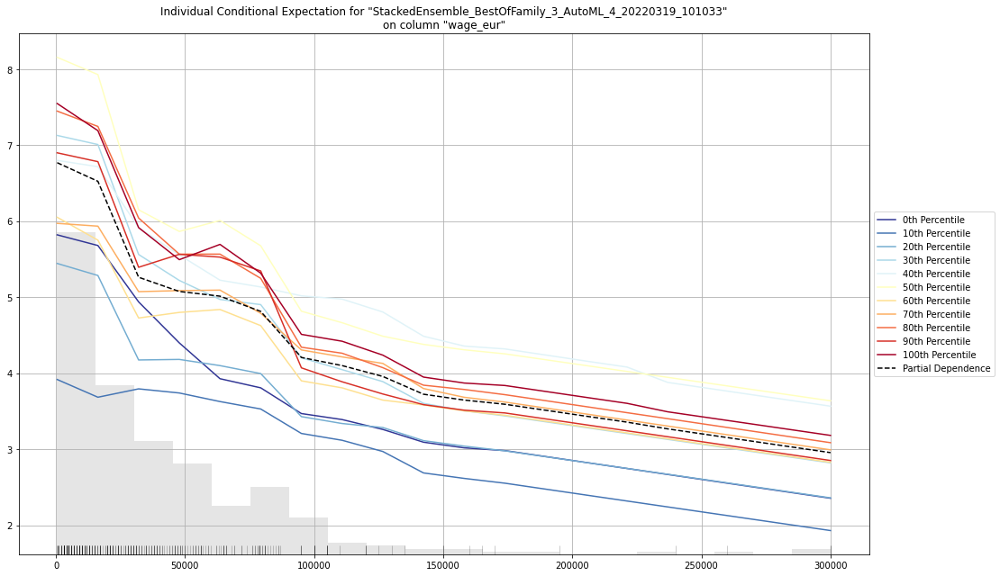

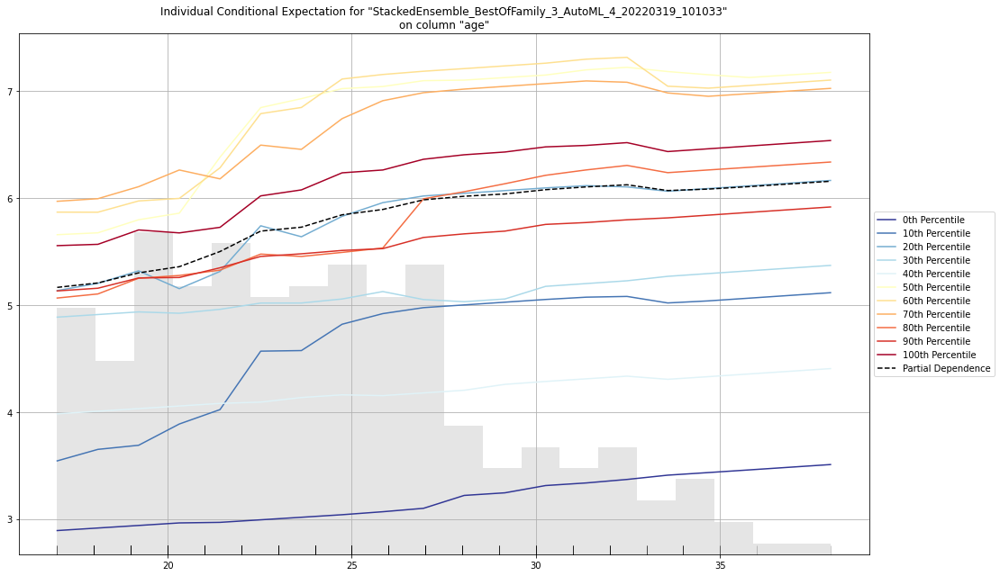

...

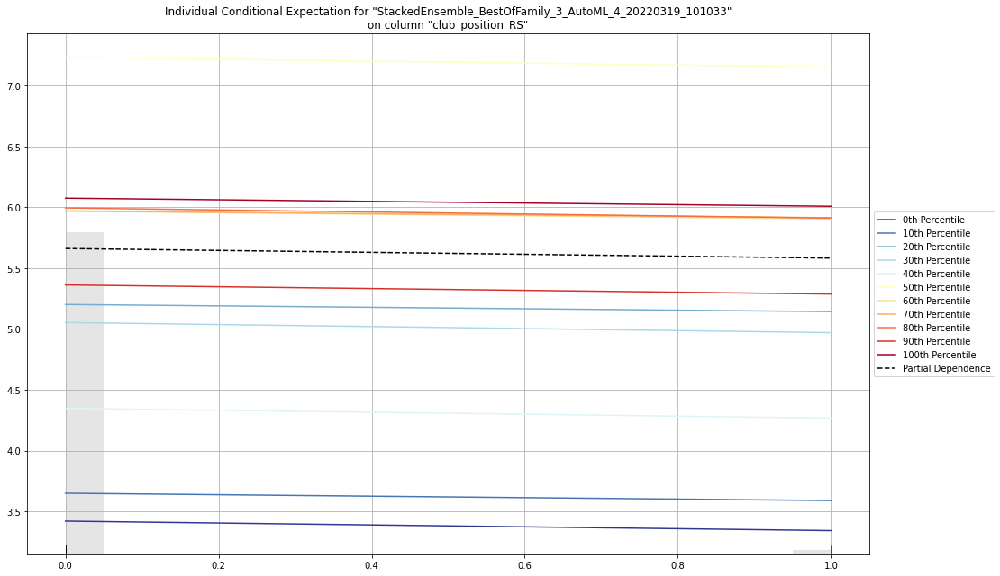

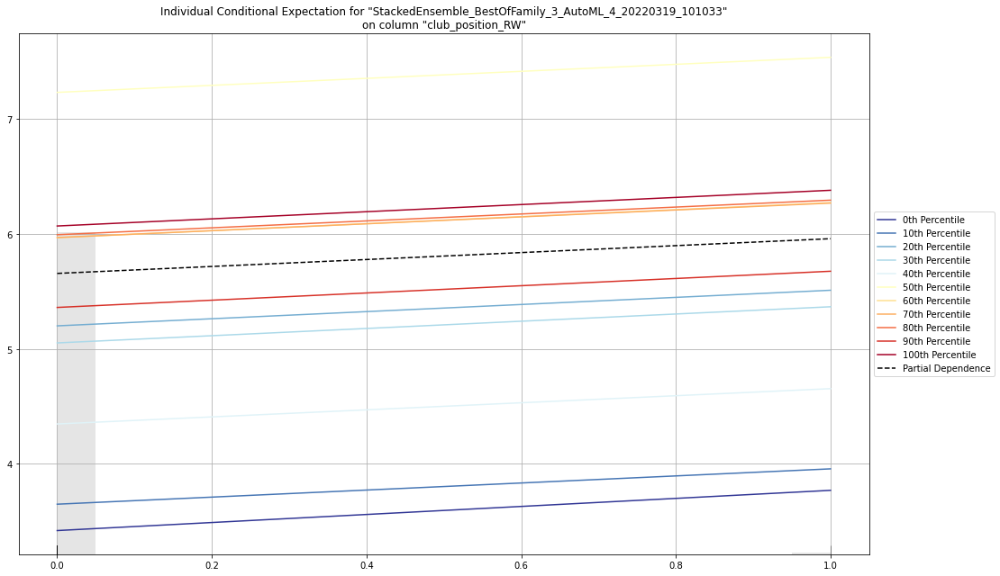

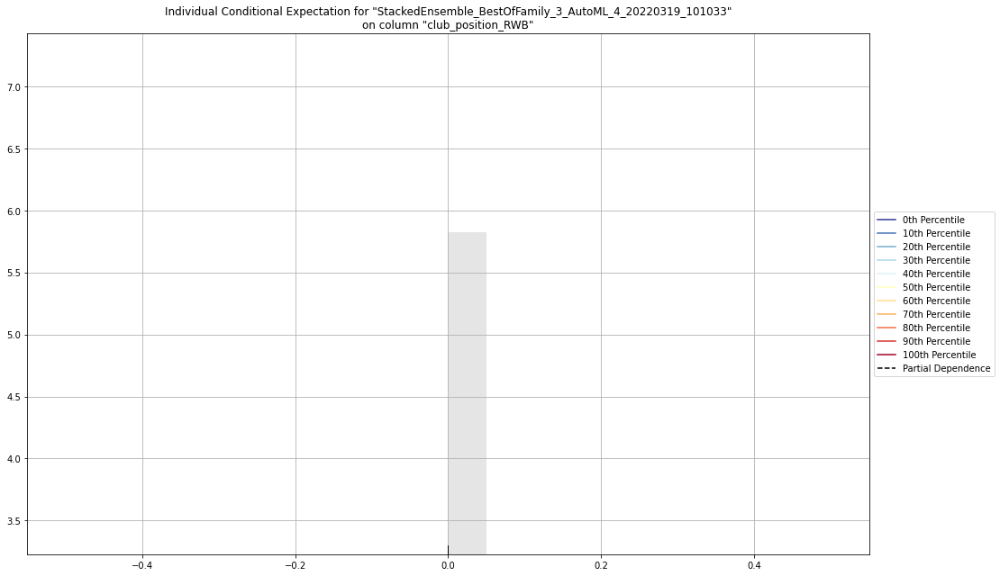

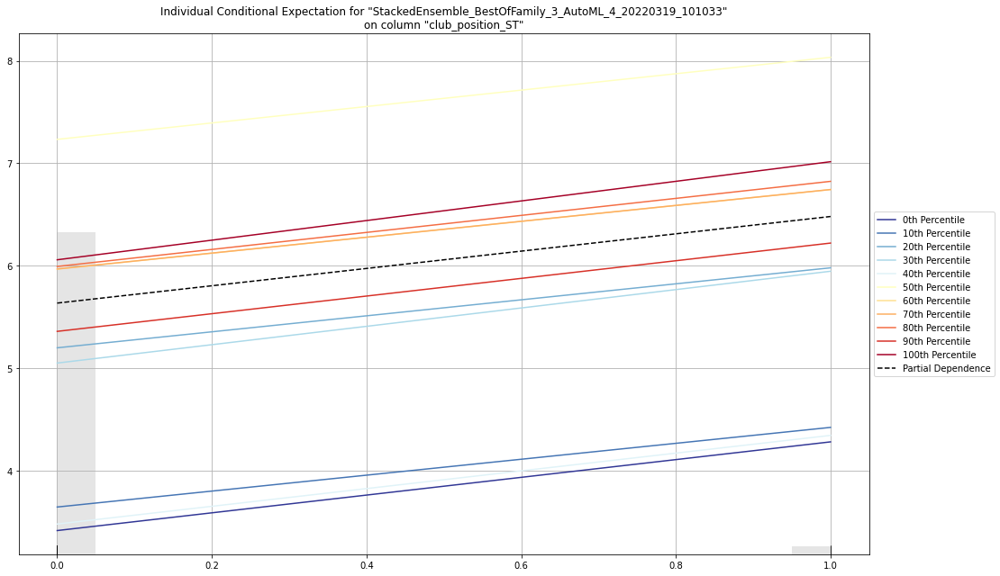

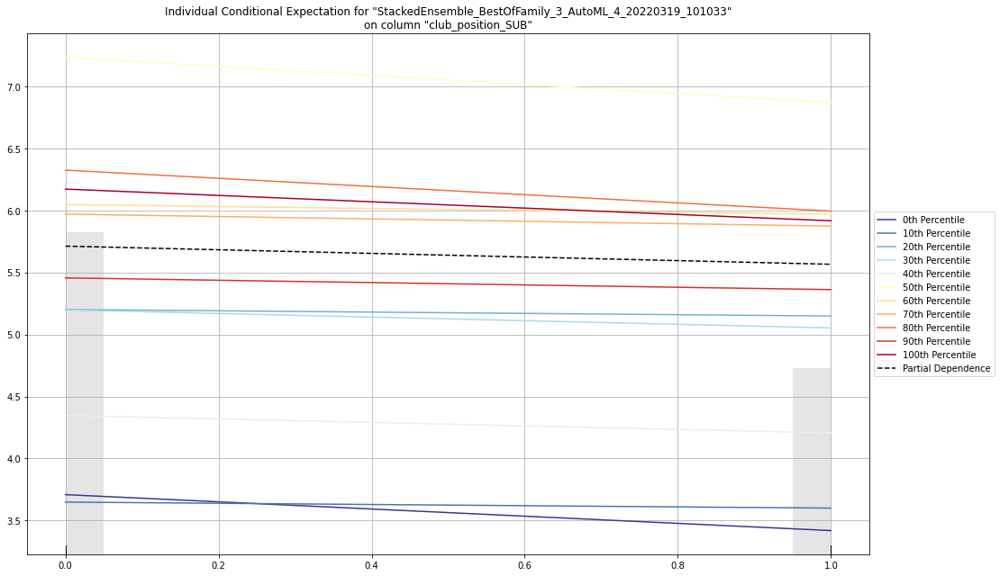

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

In [47]:
aml.leader.explain(validation_frame)

## Final Thoughts

H2O AutoML models are often used in many production system dealing with large volume of data. So, it is important to know about model explanation methods that can even explain H2O model. The major drawback of most explanation frameworks popularly used is the compatability H2O models. Hence in-built model explainability for H2O model is very useful. I would recommend you to try out other examples using H2O explanation methods for your usecases.

## Reference

1. Dataset link - [FIFA Club Position Prediction dataset](https://github.com/PacktPublishing/Applied-Machine-Learning-Explainability-Techniques/tree/main/Chapter09/datasets/FIFA_Club_Position)
2. H2O Github project - https://github.com/h2oai/h2o-3
3. H2O AutoML - https://docs.h2o.ai/h2o/latest-stable/h2o-docs/automl.html
4. Model Explainability using H2O - https://docs.h2o.ai/h2o/latest-stable/h2o-docs/explain.html#
5. Some of the utility functions and code are taken from the GitHub Repository of the author - Aditya Bhattacharya https://github.com/adib0073
6. Want to connect with the author of this chapter? You can reach out by any means mentioned here: https://aditya-bhattacharya.net/contact-me/